# **Multiple Batch Linear Regression with Normalization**

In [414]:
import numpy as np
from utils import *
import matplotlib.pyplot as plt

## Loading Data

In [415]:
x_train, y_train = load_data()

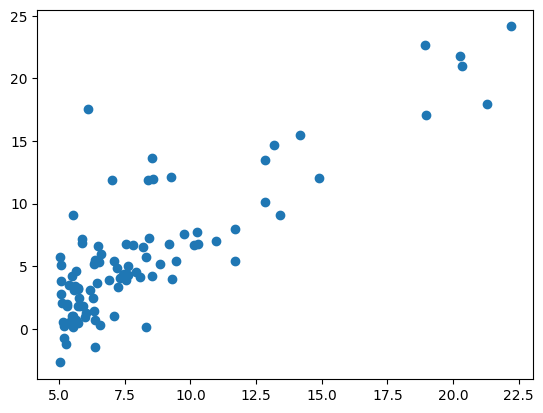

In [416]:
plt.scatter(x_train, y_train)
plt.show()

In [417]:
x_train = x_train.reshape(x_train.shape + (1,))

## Linear Regression

In [446]:
def normalize(v):
    norm = np.linalg.norm(v, axis=0)
    while norm.any == 0:
       norm[np.argmin(norm)] = 1
    return norm, v / norm
class BatchLinearRegressor:
    def __init__(self, normalize = False, debug = True) -> None:
        self.a = 0
        self.b = 0
        self.fitted = False
        self.normalize = normalize
        self.debug = debug
        if normalize:
            self.x_norm = 0
            self.y_norm = 0


    def fit(self, X, y, learning_rate = 1e-03, max_iter = 100, min_error = 1e-06, l2 = 0):
        self.a = np.zeros(X.shape[1])
        self.b = 0
        self.fitted = True
        costs = []
        if self.normalize:
            self.x_norm, X = normalize(X)
            self.y_norm, y = normalize(y)

        prev_cost = np.inf
        for i in range(1, max_iter + 1):
            print(f"Epoch {i}: ", end='')

            # Predicting
            y_hat = self.predict(X, True)

            difference = (y_hat - y).reshape(-1, 1)

            # Calcualting Cost
            m = len(y)
            cost = (1/m)*np.sum(np.power(difference, 2)) + (1/m)*l2*np.sum(np.power(self.a, 2))
            
            # Finding Gradients
            db = (2/m)*np.sum(difference)
            da = (2/m)*(difference.T@X)[:][0]

            # L2 Regularization
            da += (2*l2*self.a/m)

            # Updating parameters
            self.b -= learning_rate*db
            self.a -= learning_rate*da
                
            print("Cost=", cost)
            if(abs((prev_cost - cost)/cost) < min_error):
                print("Model Converged")
                break
            prev_cost = cost
            costs.append(cost)
            if self.debug:
                print(self.a, self.b, learning_rate)
        plt.plot(costs)
    def predict(self, X:np.ndarray, training = False):
        if not self.fitted:
            print("Please fit data before predicting!")
            return
        
        if(type(X) == int or type(X) == float):
            X = np.array(X).reshape(1,1)
        X = np.array(X)
        # print(X)
        if not training and self.normalize:
            X = X/self.x_norm

        if not training and self.normalize:
            return ((self.a @ X.T) + self.b) * self.y_norm
        else:
            return (self.a @ X.T) + self.b

    def get_params(self):
        return self.a, self.b


Epoch 1: Cost= 0.010309278350515464
[0.0037281] 0.029610085131538066 0.2
Epoch 2: Cost= 0.006753172892410588
[0.00635322] 0.047239199945429466 0.2
Epoch 3: Cost= 0.005484144085359759
[0.00831999] 0.057720245847747605 0.2
Epoch 4: Cost= 0.005029219642288591
[0.00989367] 0.0639366324314722 0.2
Epoch 5: Cost= 0.004864085634339868
[0.01123252] 0.06760866188002036 0.2
Epoch 6: Cost= 0.004802109152572795
[0.01243098] 0.06976270227712161 0.2
Epoch 7: Cost= 0.004776857010349726
[0.01354537] 0.07101110617299322 0.2
Epoch 8: Cost= 0.004764681882221242
[0.01460932] 0.07171921582960993 0.2
Epoch 9: Cost= 0.004757166344133352
[0.01564287] 0.07210500202754926 0.2
Epoch 10: Cost= 0.004751314153010135
[0.01665798] 0.07229851065291487 0.2
Epoch 11: Cost= 0.004746058769884517
[0.0176618] 0.0723773297689396 0.2
Epoch 12: Cost= 0.004741020546339532
[0.01865859] 0.07238775000942772 0.2
Epoch 13: Cost= 0.0047360643370603665
[0.01965089] 0.07235738931010131 0.2
Epoch 14: Cost= 0.0047311420291882185
[0.020640

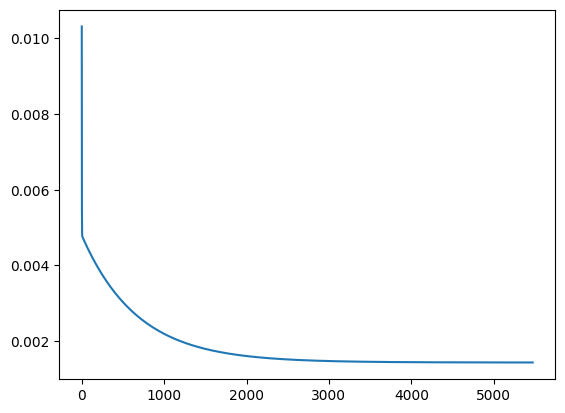

In [419]:
model = BatchLinearRegressor(True)
model.fit(x_train, y_train, 0.2, 10000)

In [420]:
model.predict(20.5)

array([20.31351828])

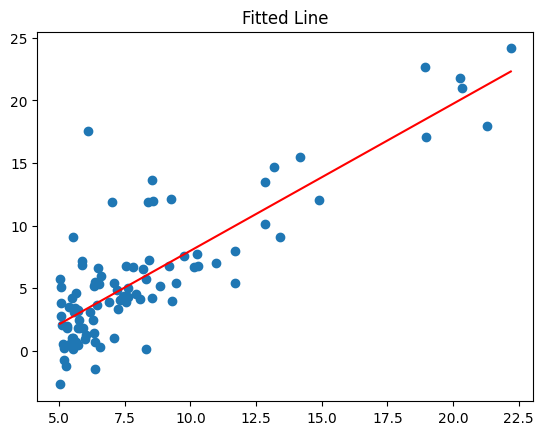

In [421]:
plt.scatter((x_train), (y_train))
x = np.linspace(min(x_train), max(x_train))
plt.plot(x, model.predict(x), color = "red")
plt.title("Fitted Line")
plt.show()

In [422]:
model.predict(5)

array([2.13324597])

## Multiple Linear Regresssion Test

In [423]:
x_train, y_train = load_data_multi()

Epoch 1: Cost= 0.02127659574468085
[0.00417681 0.00403973] 0.027418761307003565 0.1
Epoch 2: Cost= 0.014236784175216129
[0.007575   0.00726709] 0.049125700118668944 0.1
Epoch 3: Cost= 0.009817252674679975
[0.01035627 0.00985082] 0.06630737994752825 0.1
Epoch 4: Cost= 0.007042424187352411
[0.0126487  0.01192459] 0.07990387198698254 0.1
Epoch 5: Cost= 0.005299946776519151
[0.01455381 0.01359433] 0.09065996051333686 0.1
Epoch 6: Cost= 0.00420545829195277
[0.01615199 0.01494394] 0.09916571106714386 0.1
Epoch 7: Cost= 0.0035177016167033393
[0.01750695 0.01603991] 0.10588861115071069 0.1
Epoch 8: Cost= 0.0030852440547525016
[0.01866916 0.01693489] 0.11119903413606863 0.1
Epoch 9: Cost= 0.0028130340618204787
[0.01967861 0.01767063] 0.11539041339495106 0.1
Epoch 10: Cost= 0.0026414095148834874
[0.02056698 0.01828018] 0.11869522552968059 0.1
Epoch 11: Cost= 0.0025329215855782383
[0.02135937 0.01878972] 0.1212976533068307 0.1
Epoch 12: Cost= 0.002464064325706834
[0.02207566 0.01922002] 0.1233436

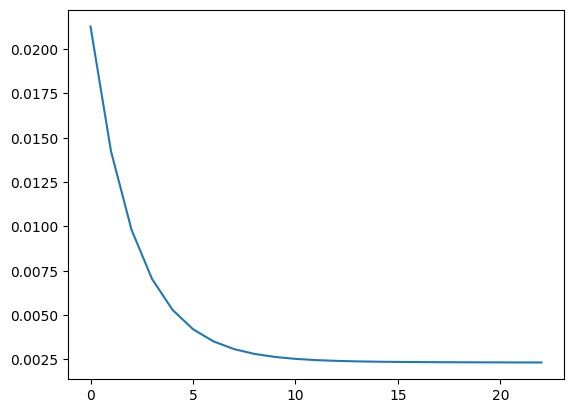

In [424]:
model_2 = BatchLinearRegressor(True)
model_2.fit(x_train, y_train, 0.1, 100, 1e-3)


Epoch 1: Cost= 131183096212.91489
[15.28418256  0.02240735] 0.006808253191489362 1e-08
Epoch 2: Cost= 108901879366.80959
[29.1558471   0.04277456] 0.013004929398499704 1e-08
Epoch 3: Cost= 90548686401.12326
[41.74553426  0.06129017] 0.018646548717914078 1e-08
Epoch 4: Cost= 75431033968.92482
[53.17172052  0.0781253 ] 0.02378440783002999 1e-08
Epoch 5: Cost= 62978518731.036514
[63.54193312  0.09343525] 0.028465062730938347 1e-08
Epoch 6: Cost= 52721295497.9862
[72.95376195  0.10736098] 0.032730766852234444 1e-08
Epoch 7: Cost= 44272349526.15704
[81.49577794  0.12003041] 0.03661986869102898 1e-08
Epoch 8: Cost= 37312894085.083336
[89.24836658  0.13155965] 0.040167172692194865 1e-08
Epoch 9: Cost= 31580342332.2814
[96.28448434  0.14205406] 0.04340426677896714 1e-08
Epoch 10: Cost= 26858399663.06418
[102.6703453    0.15160929] 0.046359819614154384 1e-08
Epoch 11: Cost= 22968902710.317646
[108.46604424   0.16031212] 0.049059850389367214 1e-08
Epoch 12: Cost= 19765097071.97372
[113.72612214 

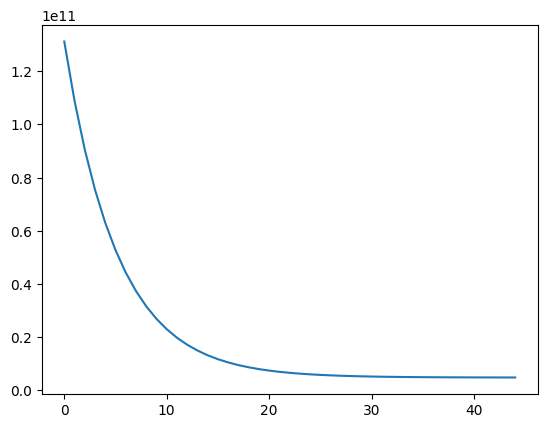

In [425]:
model_3 = BatchLinearRegressor()
model_3.fit(x_train, y_train, 1e-8, 15000, 1e-3)

In [426]:
for i in range(10):
    print("Model 2:", model_2.predict(x_train[i]), y_train[i], f"Loss: {model_2.predict(x_train[i]) - y_train[i]}")
    print("Model 3:", model_3.predict(x_train[i]), y_train[i], f"Loss: {model_3.predict(x_train[i]) - y_train[i]}")

Model 2: 340155.1563063931 399900.0 Loss: -59744.843693606905
Model 3: 343945.52460095455 399900.0 Loss: -55954.47539904545
Model 2: 337759.09234289307 329900.0 Loss: 7859.092342893069
Model 3: 261555.7317181474 329900.0 Loss: -68344.2682818526
Model 2: 341562.3684754328 369000.0 Loss: -27437.6315245672
Model 3: 392333.1807384762 369000.0 Loss: 23333.18073847622
Model 2: 334457.32714567153 232000.0 Loss: 102457.32714567153
Model 3: 231476.66706735527 232000.0 Loss: -523.3329326447274
Model 2: 346841.837261575 539900.0 Loss: -193058.16273842502
Model 3: 490416.5188798394 539900.0 Loss: -49483.481120160606
Model 2: 342016.43066841527 299900.0 Loss: 42116.43066841527
Model 3: 324492.63043529727 299900.0 Loss: 24592.630435297266
Model 2: 337445.3220619586 314900.0 Loss: 22545.322061958606
Model 3: 250766.5921739703 314900.0 Loss: -64133.407826029696
Model 2: 336936.6338792314 198999.0 Loss: 137937.6338792314
Model 3: 233275.10836750132 198999.0 Loss: 34276.10836750132
Model 2: 336713.19140

## **Extra: Polynomial Regression with Regularization**

In [427]:
X = np.random.uniform(-1, 5, 6)
y = X**2 + 3.59 + np.random.normal(0, 0.8, 6)

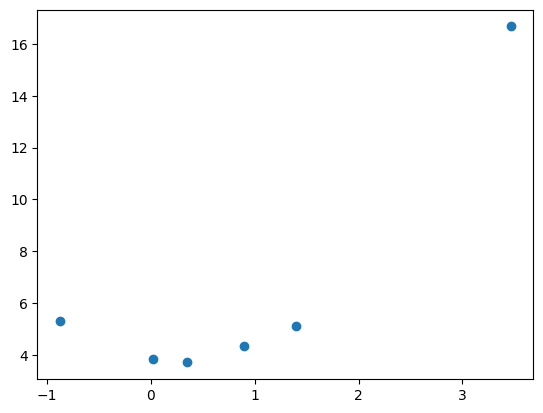

In [428]:
plt.scatter(X, y)

In [429]:
X = X.reshape(-1, 1)

In [430]:
# Adding polynomial features
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(5)
X_poly = poly.fit_transform(X)[:, 1:]

### **Linear Regression**

Epoch 1: Cost= 63.32496470837758
[0.21858374] 0.1300243997472786 0.01
Epoch 2: Cost= 57.04780378314082
[0.42348312] 0.25361926476420765 0.01
Epoch 3: Cost= 51.49104204792714
[0.61552487] 0.37115290200618845 0.01
Epoch 4: Cost= 46.57120476504667
[0.79548614] 0.48297176985045687 0.01
Epoch 5: Cost= 42.21450941450583
[0.96409745] 0.5894017838450127 0.01
Epoch 6: Cost= 38.35573985004859
[1.12204549] 0.6907495443014131 0.01
Epoch 7: Cost= 34.93725124461918
[1.26997575] 0.7873034904109758 0.01
Epoch 8: Cost= 31.908090631133703
[1.40849497] 0.879334985283736 0.01
Epoch 9: Cost= 29.223219609591656
[1.53817348] 0.9670993360460747 0.01
Epoch 10: Cost= 26.842827351638295
[1.65954738] 1.050836752885286 0.01
Epoch 11: Cost= 24.73172341253086
[1.77312059] 1.1307732506965302 0.01
Epoch 12: Cost= 22.858801079119438
[1.87936676] 1.207121496768736 0.01
Epoch 13: Cost= 21.196563059535634
[1.9787311] 1.2800816077402435 0.01
Epoch 14: Cost= 19.72070227223739
[2.0716321] 1.3498418988615244 0.01
Epoch 15: Co

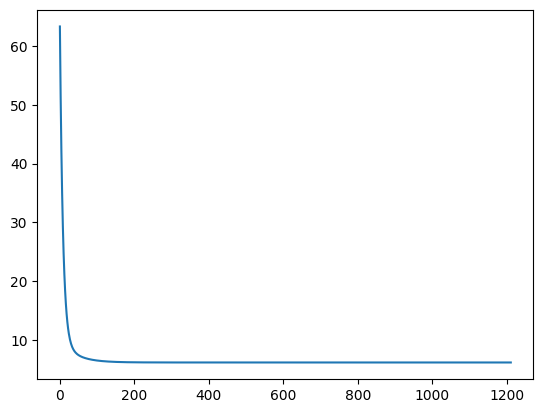

In [440]:
# Trained as much as possible
linear_model = BatchLinearRegressor()
linear_model.fit(X, y, max_iter=10000, learning_rate=0.01, min_error=1e-15)
plt.show()

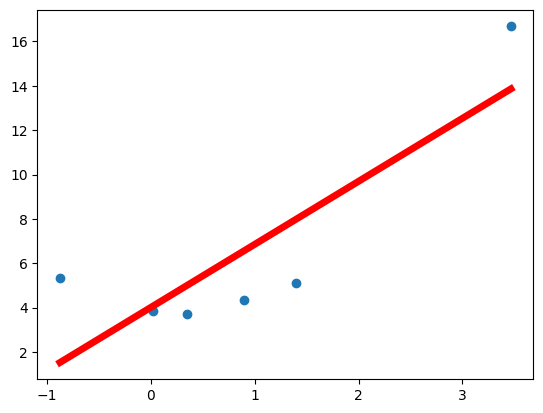

In [441]:
plt.scatter(X, y)
sx = np.linspace(min(X), max(X))
sy = linear_model.predict(sx.reshape(-1, 1))
plt.plot(sx, sy, color='red', linewidth = 5)
plt.show()

### **Polynomial Features No Regularization**

In [444]:
# Trained as much as possible
poly_model = BatchLinearRegressor()
poly_model.fit(X_poly, y, 1e-7, max_iter= 500000, min_error=1e-15)

Epoch 1: Cost= 63.32496470837758
[2.18583743e-06 7.27870492e-06 2.36091061e-05 8.11061960e-05
 2.79114293e-04] 1.300243997472786e-06 1e-07
Epoch 2: Cost= 62.47784251303674
[4.35395764e-06 1.44962060e-05 4.70063083e-05 1.61478214e-04
 5.55684095e-04] 2.5953379412520578e-06 2e-07
Epoch 3: Cost= 61.646084269865554
[8.65508638e-06 2.88099154e-05 9.33807658e-05 3.20767272e-04
 1.10378108e-03] 5.175319549748359e-06 6e-07
Epoch 4: Cost= 60.02021215697478
[2.13497218e-05 7.10299179e-05 2.30007410e-04 7.89984103e-04
 2.71809192e-03] 1.285458454217885e-05 2.4e-06
Epoch 5: Cost= 55.405160278610886
[6.96688942e-05 2.31414082e-04 7.47099138e-04 2.56493860e-03
 8.82212889e-03] 4.285675274087256e-05 1.2e-05
Epoch 6: Cost= 40.298415064346194
[0.00026477 0.00087271 0.00277642 0.00951287 0.03266431] 0.00017935122928004453 7.2e-05
Epoch 7: Cost= 16.82227620563014
[0.00034537 0.00095516 0.00191591 0.00603356 0.01917943] 0.0006814778690313023 0.000504
Epoch 8: Cost= 22.96310740551435
[0.00517514 0.01626918

KeyboardInterrupt: 

In [ ]:
poly_model.get_params()

(array([ 0.60445442,  0.42743492,  0.25955278,  0.02085143, -0.01118142]),
 1.220137715306978)

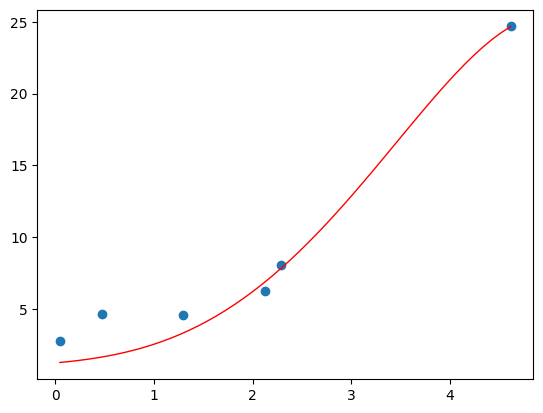

In [ ]:
a, b = poly_model.get_params()
plt.scatter(X, y)
sx = np.linspace(min(X), max(X))
sy = np.polyval(np.append(np.flip(a), b), sx)
plt.plot(sx, sy, color='red', linewidth = 1)
plt.show()

### **Polynomial Features With Regularization**

In [1]:
# Trained as much as possible
poly_model_regularized = BatchLinearRegressor()
poly_model_regularized.fit(X_poly, y, 1e-6, max_iter= 100000, min_error=1e-15, l2=0.001)

NameError: name 'BatchLinearRegressor' is not defined

In [ ]:
poly_model_regularized.get_params()

(array([ 0.64670259,  0.52746091,  0.3496974 ,  0.11908591, -0.12185048]),
 4.676830077945316)

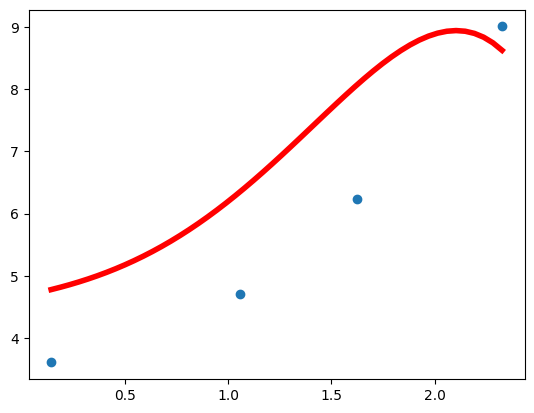

In [ ]:
a, b = poly_model_regularized.get_params()
plt.scatter(X, y)
sx = np.linspace(min(X), max(X))
sy = np.polyval(np.append(np.flip(a), b), sx)
plt.plot(sx, sy, color='red', linewidth = 4)
plt.show()

# Test

Epoch 1: Cost= 16.0
[0.988] 4.992
Epoch 2: Cost= 15.792712000000002
[0.976084] 4.984052
Epoch 3: Cost= 15.588252513448003
[0.96425142] 4.976155644
Epoch 4: Cost= 15.386582900346038
[0.9525017] 4.968310578440001
Epoch 5: Cost= 15.187665048565577
[0.94083426] 4.960516452183277
Epoch 6: Cost= 14.991461366636187
[0.92924854] 4.952772916499772
Epoch 7: Cost= 14.797934776632683
[0.91774398] 4.9450796250495985
Epoch 8: Cost= 14.6070487071595
[0.90632002] 4.93743623386666
Epoch 9: Cost= 14.418767086430854
[0.89497611] 4.929842401342378
Epoch 10: Cost= 14.23305433544549
[0.8837117] 4.922297788209531
Epoch 11: Cost= 14.049875361254589
[0.87252625] 4.914802057526213
Epoch 12: Cost= 13.869195550321766
[0.86141921] 4.90735487465989
Epoch 13: Cost= 13.690980761973648
[0.85039005] 4.899955907271574
Epoch 14: Cost= 13.515197321940018
[0.83943823] 4.892604825300101
Epoch 15: Cost= 13.341812015982162
[0.82856323] 4.885301300946521
Epoch 16: Cost= 13.170792083608305
[0.81776451] 4.878045008658591
Epoch 1

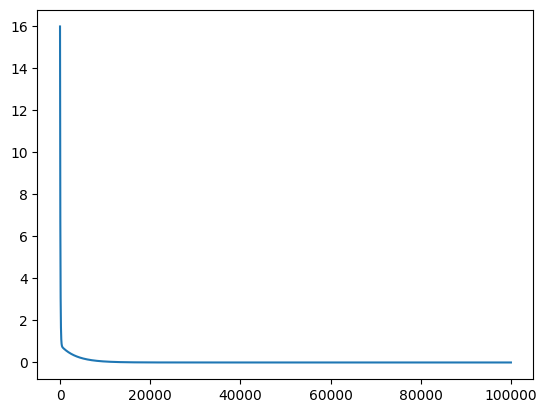

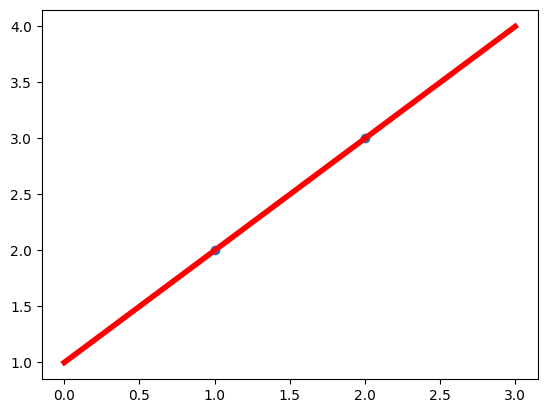

In [ ]:
model = BatchLinearRegressor()
model.fit(np.array([[1],[2]]), np.array([2,3]), learning_rate=1e-3, min_error=1e-9, max_iter=100000)
plt.show()
plt.scatter(np.array([1,2]), np.array([2,3]))
sx = np.linspace(0, 3)
sy = model.predict(sx.reshape(-1, 1))
plt.plot(sx, sy, color='red', linewidth = 4)
plt.show()